# Imports and Hyperparameters

In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST

plt.style.use('standard.mplstyle')

In [5]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "pancreas_reduced"

# for the filename
parameters = "2-0_5"

# Data Preperation

In [6]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2)
position, labels, embedding = data_loader(dataset, True)
# calculate the clusters
cluster_centers = centers(position)
# Save the number of nodes (sometimes needed)
number_of_nodes = len(position)

print("Time for data preperation: ", time.time()-start)

sklearn is done: 169.13245844841003
My own part is done: 34.12416434288025
Time for data preperation:  257.3956513404846


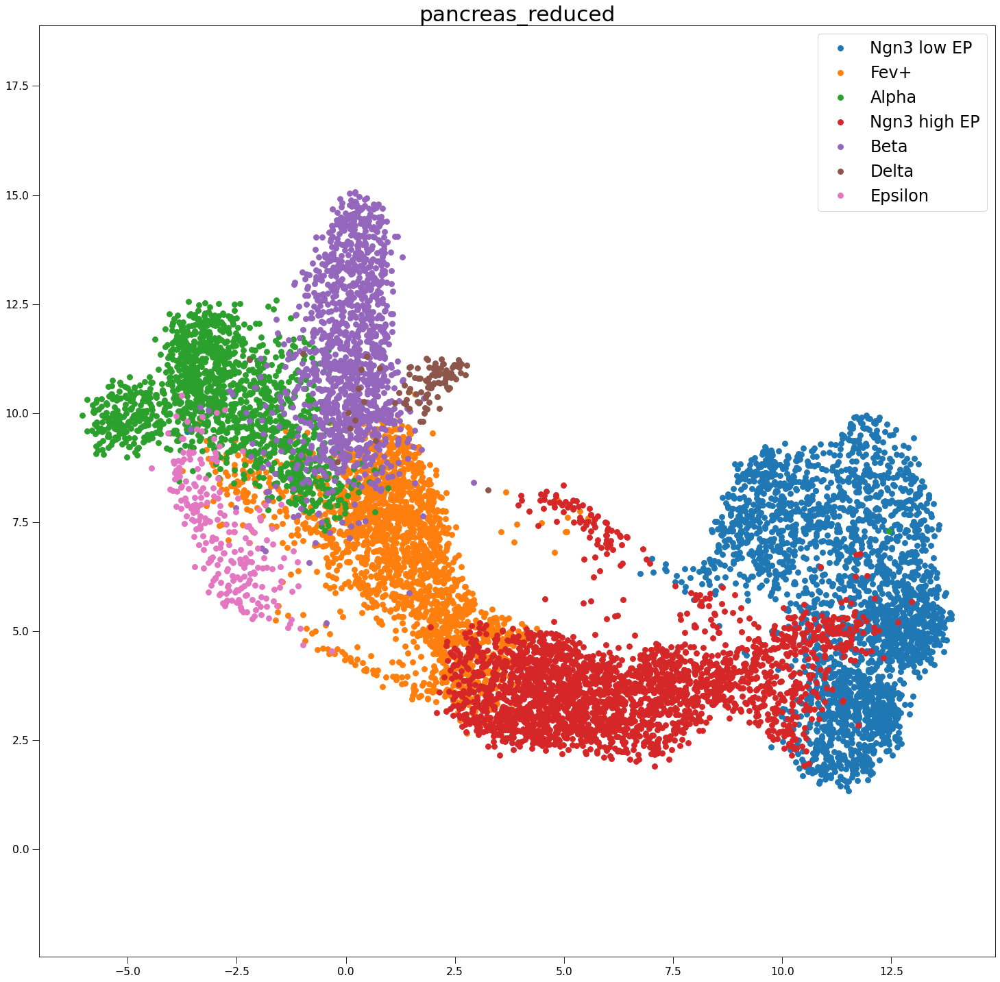

In [7]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
plt.show()

In [8]:
# Create the graph
start = time.time()

if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)
    
G, _ = create_graph(number_of_nodes, mode, position=pca, beta=2, delta=0.5)
G.indexEdges()
print("Time for graph construction: ",time.time()-start)

Final k: 11



Time for graph construction:  37.54947781562805


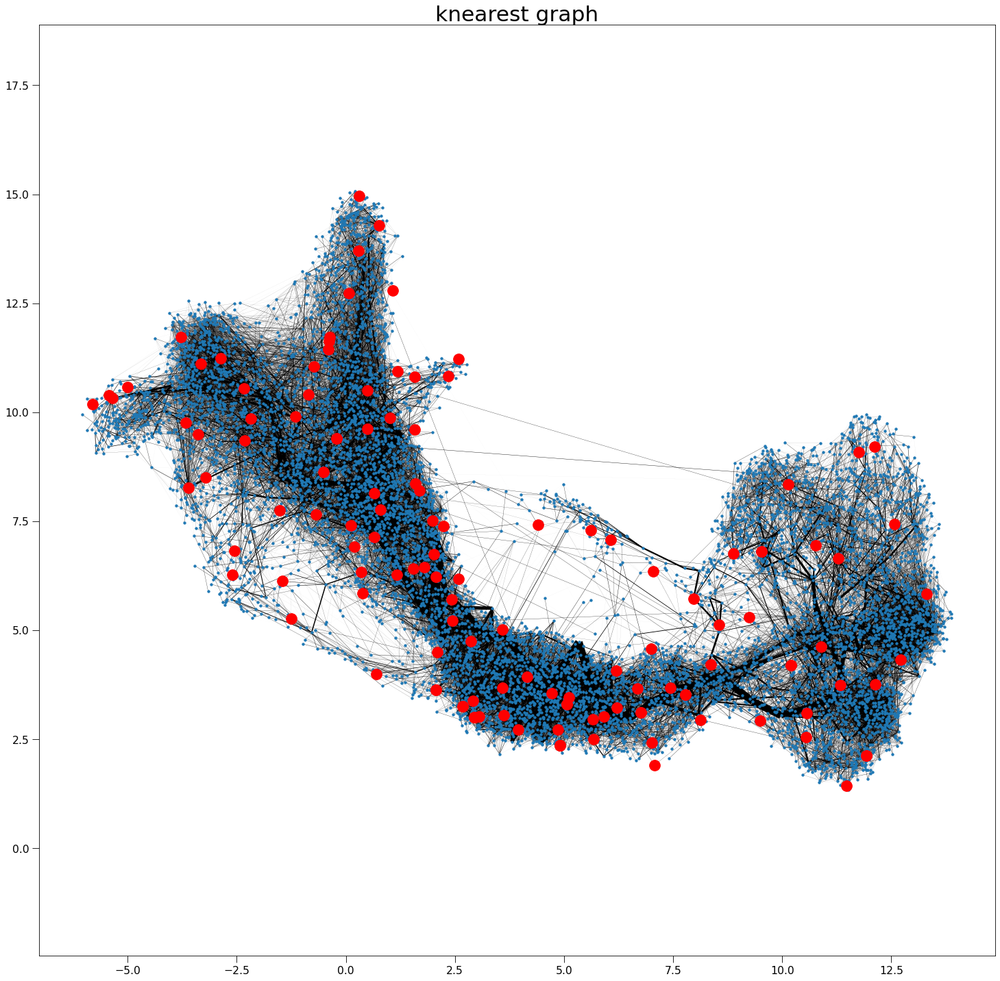

In [9]:
# plot the graph
fig, ax = plt.subplots(1, figsize=(24,24))
plot_graph(G, embedding, "knearest graph", ax, cluster_centers)
plt.show()

## Cluster ICT

In [10]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1)
ICT.indexEdges()
print("Time for calculating the actual ICT: ", time.time()-start)

update Arr 96502 -> 47081
added 250 edges early
update Arr 47081 -> 42697
added 44 edges early
update Arr 42697 -> 38663
added 88 edges early
update Arr 38663 -> 35099
added 188 edges early
update Arr 35099 -> 31742
added 231 edges early
update Arr 31742 -> 28778
added 170 edges early
update Arr 28778 -> 26148
added 331 edges early
update Arr 26148 -> 23547
added 491 edges early
update Arr 23547 -> 21314
added 427 edges early
update Arr 21314 -> 19198
added 651 edges early
update Arr 19198 -> 17451
added 633 edges early
update Arr 17451 -> 15655
added 661 edges early
update Arr 15655 -> 14212
added 479 edges early
update Arr 14212 -> 12907
added 604 edges early
update Arr 12907 -> 11585
added 994 edges early
update Arr 11585 -> 10375
added 768 edges early
update Arr 10375 -> 10176
added 177 edges early
update Arr 10176 -> 10175
added 2673 edges early

Time for calculating the actual ICT:  112.96830582618713


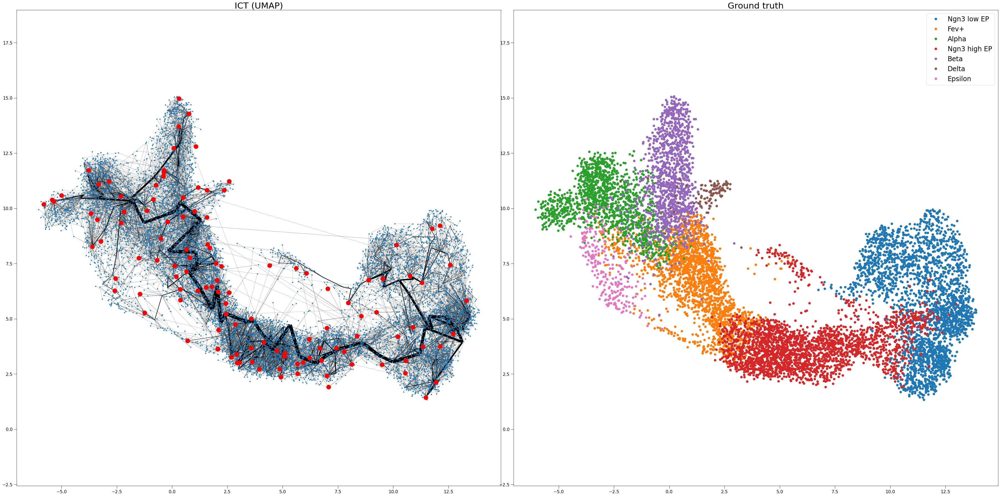

In [11]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers)
plot_points(embedding, "Ground truth", ax2, labels)

plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

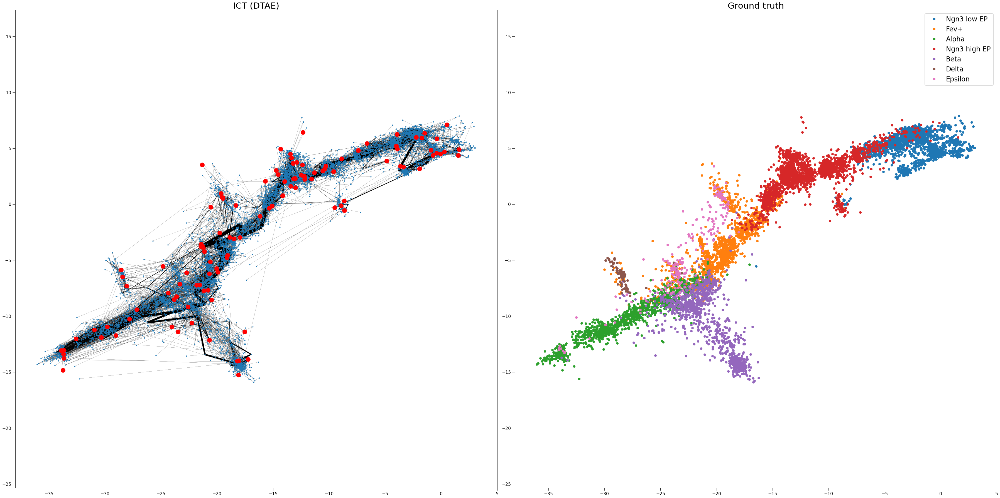

In [12]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

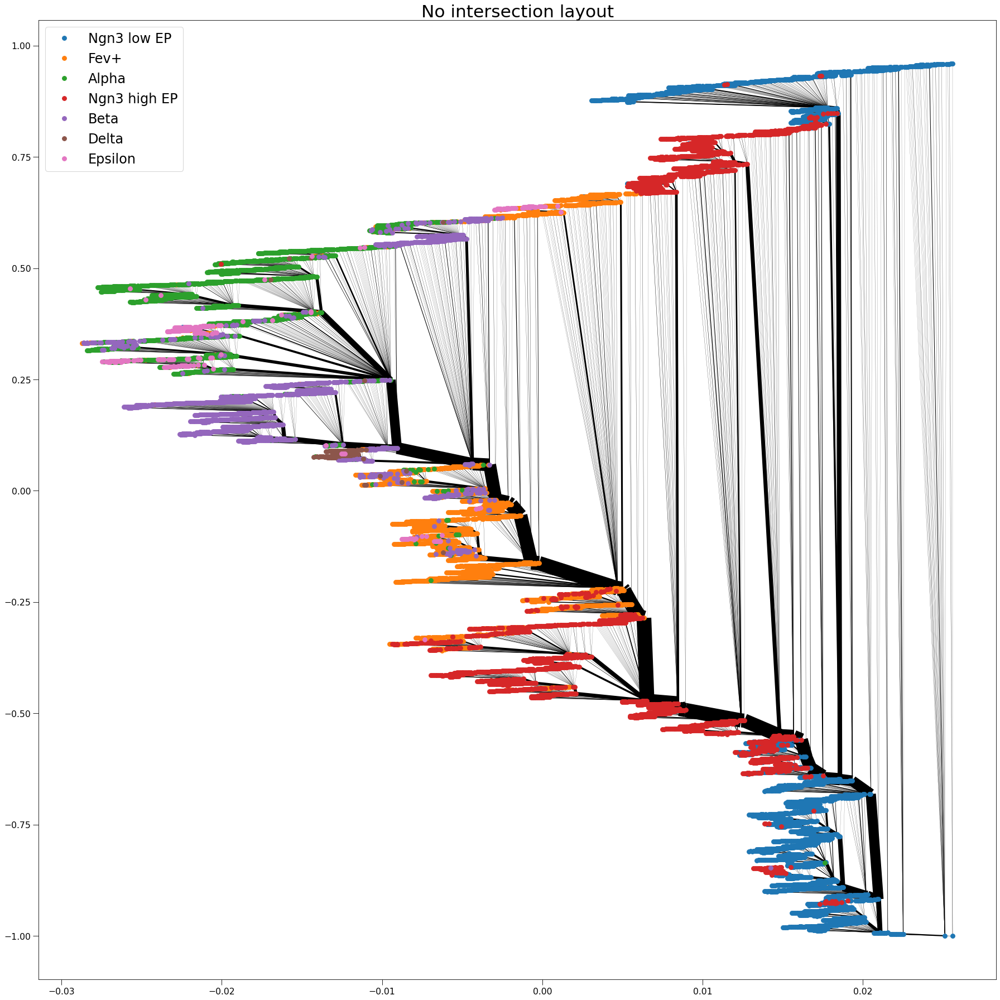

In [13]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()

# Create the MST for the DTAE autoencoder

### MST created in real space

sklearn is done: 64.74816393852234
My own part is done: 12.777425765991211


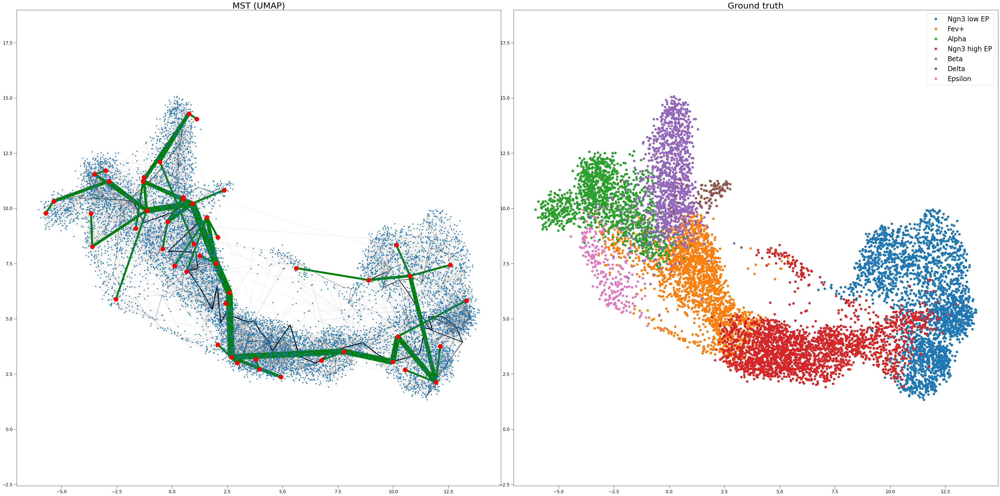

In [14]:
DTAE_centers = k_means_pp(50, position)
mst = MST(ICT, position, DTAE_centers)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
plot_graph(ICT, embedding, "ICT (UMAP)", ax1, DTAE_centers, edge_scale=0.3)
plot_graph(mst, embedding[DTAE_centers], "MST (UMAP)", ax1, edge_scale=2, node_size=0, edge_color="green")
plot_points(embedding, "Ground truth", ax2, labels)

plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-MST-"+parameters+".png")

plt.show()

### MST created in PCA space (if it exists)

sklearn is done: 66.90941071510315
My own part is done: 13.174593925476074


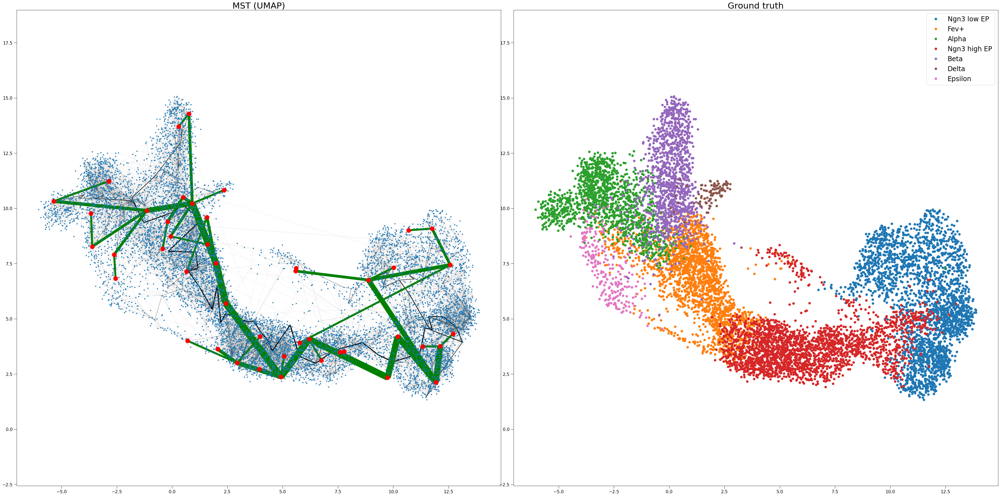

In [15]:
if len(position[0]) > 500:
    DTAE_centers = k_means_pp(50, position)
    mst = MST(ICT, pca, DTAE_centers)

    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, embedding, "ICT (UMAP)", ax1, DTAE_centers, edge_scale=0.3)
    plot_graph(mst, embedding[DTAE_centers], "MST (UMAP)", ax1, edge_scale=2, node_size=0, edge_color="green")
    plot_points(embedding, "Ground truth", ax2, labels)

    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-MST-PCA-"+parameters+".png")
    plt.show()

else:
    print("PCA space was not computed before!")

### Cluster Centers in standardized space

sklearn is done: 64.75727963447571
My own part is done: 12.968328714370728


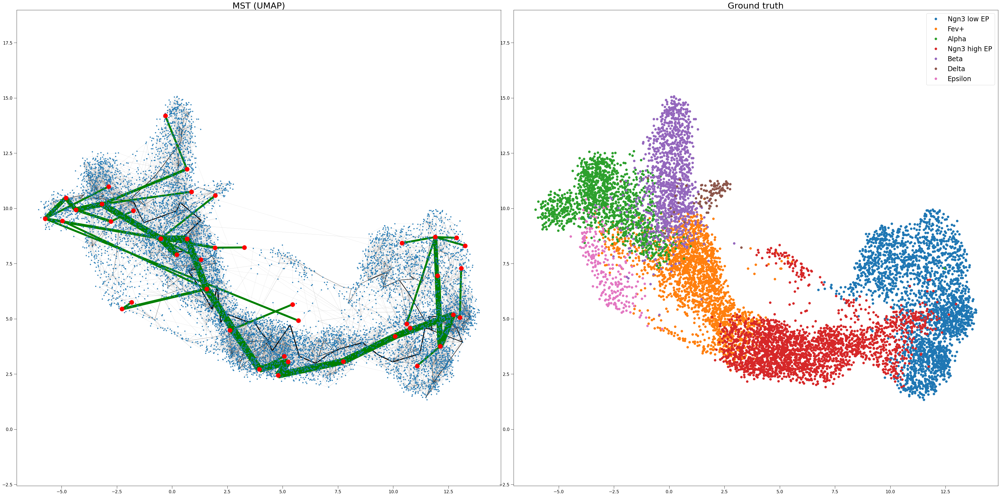

In [17]:
pos = StandardScaler().fit_transform(position)
DTAE_centers = k_means_pp(50, pos)
mst = MST(ICT, position, DTAE_centers)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
plot_graph(ICT, embedding, "ICT (UMAP)", ax1, DTAE_centers, edge_scale=0.3)
plot_graph(mst, embedding[DTAE_centers], "MST (UMAP)", ax1, edge_scale=2, node_size=0, edge_color="green")
plot_points(embedding, "Ground truth", ax2, labels)

plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-MST-"+parameters+".png")

plt.show()